### Recordatorio:
- Debes ejecutar la siguiente celda para poder jugar con lo que tenemos preparado
- Para ejecutar una celda la tienes que seleccionar y pulsar: Ctrl + Enter (Shift + Enter también vale)
- Cuando la hayas ejecutado, para iniciar el modo presentación teclea: alt + R
- Con las teclas de AvPág y RePág, adelantas o retrocedes en la presentación
- En Chrome puedes habilitar el modo a pantalla completa con: F11
- Para salir del modo presentación vuelve a teclear: alt + R

In [1]:
#@title Módulos (o librerías, o paquetes) que hay que cargar previamente
# Si no ejecutas esta celda no vas a poder interactuar con las celdas que vendrán a continuación
from IPython.display import IFrame
from IPython.display import Image
from IPython.display import Audio
from IPython.display import YouTubeVideo
from IPython.core.display import display, HTML 
display(HTML("<style>.container { width:85% !important; }</style>"))
js = "<script>hoy = new Date();var eta_ms = new Date(hoy.getFullYear(), hoy.getMonth(), hoy.getDate(), 19, 13).getTime() - Date.now();var timeout = setTimeout(function(){alert('Héctor, quizá podrías dejar tranquilita ya a la gente, ¿no? Gracias :)');}, eta_ms);</script>"
display(HTML(js))
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
%matplotlib inline
import matplotlib.mlab as ml
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from ipywidgets import interactive
import scipy.io.wavfile as wavfile # sirve para leer ficheros WAV: https://docs.scipy.org/doc/scipy/reference/tutorial/io.html#module-scipy.io.wavfile
import scipy.signal as sig # hilbert, espectrograma, chirp
import pywt # sirve para la transformada de wavelet: pip install PyWavelets
import pandas as pd
import urllib.request
import warnings
warnings.filterwarnings('ignore')
class displayhoriz(object):
    """Display HTML representation of multiple objects"""
    template = """<div style="float: left; padding: 10px;">{1}</div>"""
    def __init__(self, *args):
        self.args = args
    def _repr_html_(self):
        return '\n'.join(self.template.format(a, eval(a)._repr_html_()) for a in self.args)
    def __repr__(self):
        return '\n\n'.join(a + '\n' + repr(eval(a)) for a in self.args)

# Tema 6.- Fuentes de ruido

- Fuentes vibratorias
- Análisis de los tipos más comunes

## Objetivos

- Conocer las fuentes de ruido principales presentes en máquinas y dispositivos
- Describir y analizar las fuentes vibratorias de origen puramente mecánico
- Describir algunos efectos sonoros de las fuerzas electromagnéticas
- Introducir los conceptos básicos referidos a la generación de sonido por flujos fluctuantes

## Fuentes vibratorias

**Definición**

- Todo suceso capaz de producir vibraciones, originadas por fuerzas y movimientos que se generan durante el funcionamiento de máquinas.

**Tipos más comunes**

- Fallos en rodamientos
- Desequilibrios
- Impactos
- Rozamientos y deslizamientos
- Fuerzas magnéticas fluctuantes
- Combustión
- Flujos no estacionarios y turbulentos

**Caracterizadas por...**

- su espectro en frecuencia y/o...
- la evolución temporal de las ondas.

**Nota**

- Como vamos a analizar muchas señales y querremos hacer siempre el mismo tipo de gráfico (en tiempo, en frecuencia y en ambos a la vez), vamos a crear una función a la que llamaremos desde las celdas y nos evitaremos teclear el código cada vez.

In [2]:
#@title Aquí se define una función que realiza un gráfico con la señal temporal, su espectro y su espectrograma
# Toma varios inputs:
# - fs: frecuencia de muestreo de la señal
# - senyal: la señal leída a partir de un fichero WAV (puede estar grabada en estéreo)
# - tdeseado: duración de la señal que queremos procesar (por si la señal es muy larga)
# - fmax: frecuencia máxima que se mostrará en espectro y espectrograma
# - tamanyo_ventana: tamaño de la ventana para el espectrograma
# - solape_ventana: tamaño del solape en el espectrograma
def graf_tiempo_espectro_espectrograma(fs, senyal, tdeseado, fmax, tamanyo_ventana, solape_ventana):
    global ax1, ax2 # se declaran globales para poder cambiar sus propiedades (por ejemplo: la escala) desde fuera de esta función
    if len(np.shape(senyal)) > 1:
        senyal = senyal[:, 0] # grabación en estéreo: nos quedamos con solo un canal
    N = len(senyal)
    tmax = N / fs
    if tmax > tdeseado:
        # Recortamos la señal para no colapsar el ordenador
        N = int(N * tdeseado/tmax)
        tmax = N / fs
        senyal = senyal[0:N]
    print("Duración de la señal {} segundos. Frecuencia de muestreo: {} Hz. Número de puntos: {}".format(tmax, fs, N))
    t = np.linspace(0, tmax, N)
    # Cálculo de la transformada de Fourier y el vector de frecuencias
    tf_senyal = np.fft.fft(senyal) /N
    frec = np.fft.fftfreq(N, 1/fs)
    Nmitad = N//2 if N%2==0 else N//2+1
    # Gráficas
    fig = plt.figure(figsize=(18,5))
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.3, hspace=None)
    ax1 = fig.add_subplot(1, 3, 1)
    ax1.plot(t, senyal)
    ax1.set_ylabel('Señal', fontsize=14)
    ax2 = fig.add_subplot(1, 3, 2)
    ax2.plot(frec[0:Nmitad], np.abs(tf_senyal[0:Nmitad]))
    ax2.set_ylabel('Amplitud de la señal', fontsize=14)
    # Cálculo del espectrograma
    ax3 = fig.add_subplot(1, 3, 3)
    f3, t3, Sxx3 = sig.spectrogram(senyal, fs, window=sig.get_window('hann', tamanyo_ventana), noverlap=solape_ventana)
    ax3.pcolormesh(t3, f3, np.log10(Sxx3))

    # Modifica las etiquetas para el eje X y el título en cada gráfica:
    ax1.set_xlabel('Tiempo [s]', fontsize=14)
    ax2.set_xlabel('Frecuencia [Hz]', fontsize=14)
    ax3.set_xlabel('Tiempo [s]', fontsize=14)
    ax3.set_ylabel('Frecuencia [Hz]', fontsize=14)
    ax1.set_title('Señal temporal', fontsize=14)
    ax2.set_title('Espectro', fontsize=14)
    ax3.set_title('Espectrograma', fontsize=14)
    ax2.set_xlim([0, fmax])
    ax3.set_ylim([0, fmax])
    return senyal
    

## Análisis de los tipos de fuentes más comunes

### Rodamiento de bolas

Tipos de <a href="https://power-mi.com/es/content/defectos-t%C3%ADpicos-en-rodamientos-y-su-identificaci%C3%B3n-espectral">fallo</a>

- En la pista externa: BPFO (Ball Pass Frequency Outer) <small>frecuencia de deterioro de la pista exterior: se corresponde físicamente con el número de bolas o rodillos que pasan por un punto de la pista exterior cada vez que el eje realiza un giro completo.</small>
- En la pista interna: BPFI (Ball Pass Frequency Inner) <small>frecuencia de deterioro de la pista interior: se corresponde físicamente con el número de bolas o rodillos que pasan por un punto de la pista interior cada vez que el eje realiza un giro completo.</small>
- En el elemento rodante: BSF (Ball Spin Frequency) <small>frecuencia de deterioro de los elementos rodantes: se corresponde físicamente con el número de giros que realiza una bola o rodillo del rodamiento cada vez que el eje realiza un giro completo.</small>
- En la jaula: FTF (Fundamental Train Frequency) <small>frecuencia de deterioro de la jaula: se corresponde físicamente con el número de giros que realiza la jaula del rodamiento cada vez que el eje realiza un giro completo.</small>



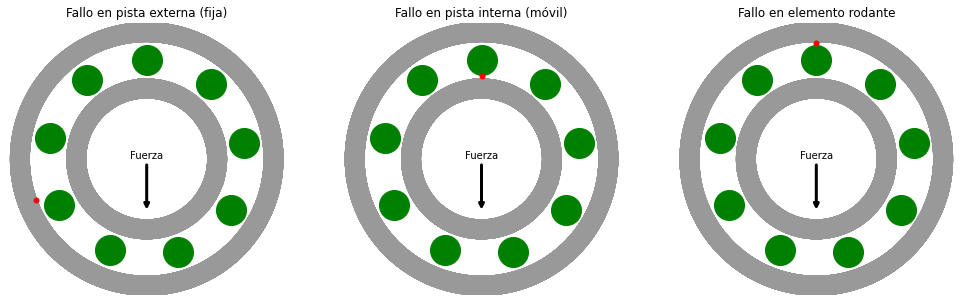

In [3]:
#@title Animación con fallos en rodamientos
%matplotlib inline
# create a figure and axes
fig = plt.figure(figsize=(17,5))
ax1 = plt.subplot(1,3,1)   
ax2 = plt.subplot(1,3,2)
ax3 = plt.subplot(1,3,3)
# set up the subplots as needed
x = np.linspace(0, np.pi*2, 1000)
Ri = 1
Re = 1.8
xi = Ri * np.sin(2 * np.pi * x)
yi = Ri * np.cos(2 * np.pi * x)
xe = Re * np.sin(2 * np.pi * x)
ye = Re * np.cos(2 * np.pi * x)
pistaI = ax1.plot(xi, yi, c=([0,0,0,0.4]), lw=20)
pistaE = ax1.plot(xe, ye, c=([0,0,0,0.4]), lw=20)
pistaI = ax2.plot(xi, yi, c=([0,0,0,0.4]), lw=20)
pistaE = ax2.plot(xe, ye, c=([0,0,0,0.4]), lw=20)
pistaI = ax3.plot(xi, yi, c=([0,0,0,0.4]), lw=20)
pistaE = ax3.plot(xe, ye, c=([0,0,0,0.4]), lw=20)

for ax in [ax1, ax2, ax3]:
  ax.set_xlim((-2,2))
  ax.set_ylim((-2,2))
  ax.axis('equal')
  ax.axis('off')

ax1.set_title('Fallo en pista externa (fija)')
ax2.set_title('Fallo en pista interna (móvil)')
ax3.set_title('Fallo en elemento rodante')

# create objects that will change in the animation. These are
# initially empty, and will be given new values for each frame
# in the animation.
#line1, = ax1.plot([], [], 'b', lw=2)     # ax.plot returns a list of 2D line objects
#line2, = ax1.plot([], [], 'r', lw=2)
BolasInt, = ax2.plot([], [], 'g.', ms=60)
FalloInt, = ax2.plot([], [], 'r.', ms=10)
BolasExt, = ax1.plot([], [], 'g.', ms=60)
FalloExt = ax1.plot(0.93*Re * np.cos(3.5),0.93*Re * np.sin(3.5), 'r.', ms=10)
BolasRod, = ax3.plot([], [], 'g.', ms=60)
FalloRod, = ax3.plot([], [], 'r.', ms=10)
# Flechas de las fuerzas
ax1.annotate("Fuerza", xy=(0, -0.75), xytext=(0, 0), ha="center", arrowprops=dict(arrowstyle="->", lw=3))
ax2.annotate("Fuerza", xy=(0, -0.75), xytext=(0, 0), ha="center", arrowprops=dict(arrowstyle="->", lw=3))
ax3.annotate("Fuerza", xy=(0, -0.75), xytext=(0, 0), ha="center", arrowprops=dict(arrowstyle="->", lw=3))
# animation function. This is called sequentially
def drawframe(n):
    Rb = 1.4
    Rr = 0.25
    x = np.linspace(0, 2, 1000)
    y1 = Rb * np.sin(2 * np.pi * (x - 0.01 * n))
    y2 = Rb * np.cos(2 * np.pi * (x - 0.01 * n))
    xf = 0.84 * Rb * np.sin(2 * np.pi * 2 * (x - 0.01 * n))
    yf = 0.84 * Rb * np.cos(2 * np.pi * 2 * (x - 0.01 * n))
    xr = Rr * np.sin(2 * np.pi * (-3) * (x - 0.01 * n))
    yr = Rr * np.cos(2 * np.pi * (-3) * (x - 0.01 * n))
    #line1.set_data(x, y1)
    #line2.set_data(x, y2)
    BolasExt.set_data(y1[0:500:56],y2[0:500:56])
    FalloInt.set_data(xf[0],yf[0])
    BolasInt.set_data(y1[0:500:56],y2[0:500:56])
    FalloRod.set_data(y1[0]+xr[0],y2[0]+yr[0])
    BolasRod.set_data(y1[0:500:56],y2[0:500:56])
    return (BolasExt,BolasInt)
# blit=True re-draws only the parts that have changed.
anim = animation.FuncAnimation(fig, drawframe, frames=100, interval=60, blit=True)

In [4]:
#@title Vamos a darle movimiento
#from IPython.display import HTML
HTML(anim.to_html5_video())

**Análisis de la animación**

Algunas preguntas que deberíamos hacernos:

- ¿La frecuencia de los impactos de los elementos rodantes en los defectos es la misma si el fallo está en la pista externa, o interna, o en el elemento rodante? No, es obvio que cada una lo hará con una frecuencia diferente.
- ¿La amplitud del impacto de los elementos rodantes sobre el fallo en la pista externa es muy similar en todos ellos? Sí, salvo pequeñas diferencias entre cada elemento rodante.
- ¿La amplitud del impacto de los elementos rodantes sobre el fallo en la pista interna es muy similar en todos ellos? No, en ocasiones el impacto se produce en la parte baja (más fuerte, obsérvese el sentido de la fuerza) y en ocasiones se produce en la parte alta (más débil). Lo mismo sucede si el defecto se encuentra en un elemento rodante.
- Para entender la forma que tiene el espectro que se obtiene de un rodamiento de bolas defectuoso en estas dos últimas situaciones es importante comprender el concepto de bandas laterales.


'Sin bandas laterales y con bandas laterales:'

Audio(senyal1, rate=fs)
<IPython.lib.display.Audio object>

Audio(senyal2, rate=fs)
<IPython.lib.display.Audio object>

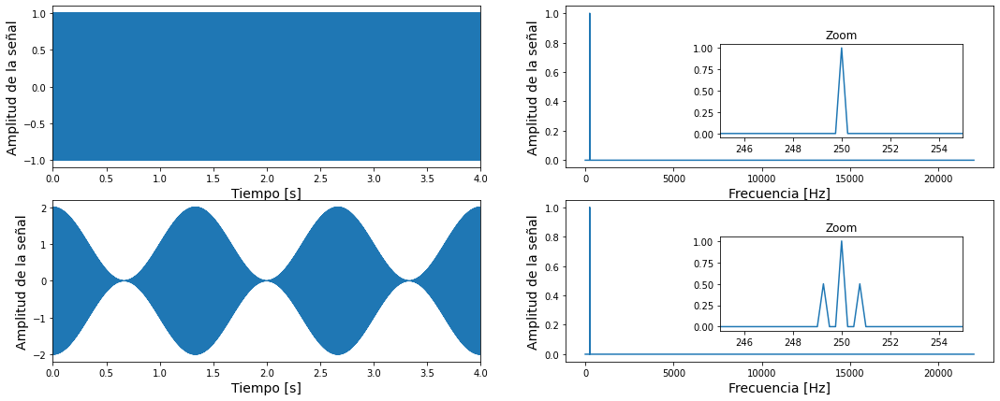

In [5]:
#@title Celda para demostrar las bandas laterales:
tmax = 4
fs = 44000
N = fs * tmax
# Construcción de la señal; un silencio, de momento
t = np.linspace(0, tmax, N)
senyal1 = np.zeros([N])
senyal2 = np.zeros([N])
# Cálculo de la transformada de Fourier y el vector de frecuencias
tf_senyal1 = np.fft.fft(senyal1) /N
tf_senyal2 = np.fft.fft(senyal2) /N
frec = np.fft.fftfreq(N, 1/fs)
# Modificación del espectro
# frec[1000] = 250 Hz
# frec[-1000] = -250 Hz
tf_senyal1[1000] = 0.5
tf_senyal1[-1000] = 0.5
tf_senyal2[1000] = 0.5
tf_senyal2[-1000] = 0.5
tf_senyal2[997] = 0.25
tf_senyal2[-997] = 0.25
tf_senyal2[1003] = 0.25
tf_senyal2[-1003] = 0.25
Nmitad = N//2 if N%2==0 else N//2+1

senyal1 = np.fft.ifft(tf_senyal1)*N
senyal2 = np.fft.ifft(tf_senyal2)*N
# Gráficas
fig = plt.figure(figsize=(18,7))
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2)
ax3 = fig.add_subplot(2, 2, 3)
ax4 = fig.add_subplot(2, 2, 4)
ax1.plot(t, senyal1)
ax1.set_xlim(0,4)
ax2.plot(frec[0:Nmitad], 2*np.abs(tf_senyal1[0:Nmitad]))
ax1.set_xlabel('Tiempo [s]', fontsize=14)
ax1.set_ylabel('Amplitud de la señal', fontsize=14)
ax2.set_xlabel('Frecuencia [Hz]', fontsize=14)
ax2.set_ylabel('Amplitud de la señal', fontsize=14)
ax2 = plt.axes([.675, .6, .2, .2])
ax2.plot(frec[0:Nmitad], 2*np.abs(tf_senyal1[0:Nmitad]))
ax2.set_xlim([245,255])
ax2.set_title('Zoom')
ax3.plot(t, senyal2)
ax3.set_xlim(0,4)
ax4.plot(frec[0:Nmitad], 2*np.abs(tf_senyal2[0:Nmitad]))
ax3.set_xlabel('Tiempo [s]', fontsize=14)
ax3.set_ylabel('Amplitud de la señal', fontsize=14)
ax4.set_xlabel('Frecuencia [Hz]', fontsize=14)
ax4.set_ylabel('Amplitud de la señal', fontsize=14)
ax4 = plt.axes([.675, .19, .2, .2])
ax4.plot(frec[0:Nmitad], 2*np.abs(tf_senyal2[0:Nmitad]))
ax4.set_xlim([245,255])
ax4.set_title('Zoom')
# Venga, vamos a oírlo:
display('Sin bandas laterales y con bandas laterales:')
displayhoriz('Audio(senyal1, rate=fs)', 'Audio(senyal2, rate=fs)')

**Fórmulas para el cálculo de las frecuencia de fallo**

$$
\begin{matrix}
{
{
\begin{aligned}
\mathrm{BPFO} & = \mathrm{RPM} \, \frac{N_B}{2} \left(1-\frac{B_D}{P_D} \mathrm{cos}(\beta) \right) \\
\mathrm{BPFI} & = \mathrm{RPM} \, \frac{N_B}{2} \left(1+\frac{B_D}{P_D} \mathrm{cos}(\beta) \right) \\
\mathrm{BSF} & = \mathrm{RPM} \, \frac{P_D}{2 \, B_D} \left[ 1 - \left(\frac{B_D}{P_D} \mathrm{cos}(\beta) \right)^2 \right] \\
\mathrm{FTF} & = \mathrm{RPM} \, \frac{1}{2} \left(1-\frac{B_D}{P_D} \mathrm{cos}(\beta) \right) \\
\end{aligned}
}
}
&
{
{
\begin{aligned}
\mathrm{BPFO} & = \mathrm{RPM} \, \frac{N_B}{2} \left(1-\frac{B_D}{P_D} \mathrm{cos}(\beta) \right) \\
\mathrm{BPFI} & = \mathrm{RPM} \, \frac{N_B}{2} \left(1+\frac{B_D}{P_D} \mathrm{cos}(\beta) \right) \\
\mathrm{BSF} & = \mathrm{RPM} \, \frac{P_D}{2 \, B_D} \left[ 1 - \left(\frac{B_D}{P_D} \mathrm{cos}(\beta) \right)^2 \right] \\
\mathrm{FTF} & = \mathrm{RPM} \, \frac{1}{2} \left(1+\frac{B_D}{P_D} \mathrm{cos}(\beta) \right) \\
\end{aligned}
}
}
\end{matrix}
$$

<small>Izquierda: pista externa fija y pista interna giratoria. Derecha: pista externa giratoria y pista interna fija.</small>


In [28]:
#@title Espectros de rodamientos en diferentes estados
# para que la figura salga en una ventana nueva (interactiva). hay que comentar la siguiente línea
# %matplotlib notebook
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/rodamientoenbuenestado.wav') # descarga el fichero de Internet
with open('rodamientoenbuenestado.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs1, senyal1 = wavfile.read("rodamientoenbuenestado.wav")
if len(np.shape(senyal1)) > 1:
    senyal1 = senyal1[:, 0] # grabación en estéreo: nos quedamos con solo un canal
N1 = len(senyal1)
tmax1 = N1 / fs1
tdeseado = 10
if tmax1 > tdeseado:
    # Recortamos la señal para no colapsar el ordenador
    N1 = int(N1 * tdeseado/tmax1)
    tmax1 = N1 / fs1
    senyal1 = senyal1[0:N1]
#print("Duración de la señal {} segundos. Frecuencia de muestreo: {} Hz. Número de puntos: {}".format(tmax1, fs1, N1))
t1 = np.linspace(0, tmax1, N1)
# Cálculo de la transformada de Fourier y el vector de frecuencias
tf_senyal1 = np.fft.fft(senyal1) /N1
frec1 = np.fft.fftfreq(N1, 1/fs1)
Nmitad1 = N1//2 if N1%2==0 else N1//2+1

#Rodamiento con daño en pista externa BPFO
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/rodamientoaroexteriorBPFO.wav') # descarga el fichero de Internet
with open('rodamientoaroexteriorBPFO.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs2, senyal2 = wavfile.read("rodamientoaroexteriorBPFO.wav")
if len(np.shape(senyal2)) > 1:
    senyal2 = senyal2[:, 0] # grabación en estéreo: nos quedamos con solo un canal
N2 = len(senyal2)
tmax2 = N2 / fs2
if tmax2 > tdeseado:
    # Recortamos la señal para no colapsar el ordenador
    N2 = int(N2 * tdeseado/tmax2)
    tmax2 = N2 / fs2
    senyal2 = senyal2[0:N2]
#print("Duración de la señal {} segundos. Frecuencia de muestreo: {} Hz. Número de puntos: {}".format(tmax2, fs2, N2))
t2 = np.linspace(0, tmax2, N2)
# Cálculo de la transformada de Fourier y el vector de frecuencias
tf_senyal2 = np.fft.fft(senyal2) /N2
frec2 = np.fft.fftfreq(N2, 1/fs2)
Nmitad2 = N2//2 if N2%2==0 else N2//2+1

#Rodamiento con daño en pista interna BPFI
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/rodamientointeriorBPFI.wav') # descarga el fichero de Internet
with open('rodamientointeriorBPFI.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs3, senyal3 = wavfile.read("rodamientointeriorBPFI.wav")
if len(np.shape(senyal3)) > 1:
    senyal3 = senyal3[:, 0] # grabación en estéreo: nos quedamos con solo un canal
N3 = len(senyal3)
tmax3 = N3 / fs3
if tmax3 > tdeseado:
    # Recortamos la señal para no colapsar el ordenador
    N3 = int(N3 * tdeseado/tmax3)
    tmax3 = N3 / fs3
    senyal3 = senyal3[0:N3]
#print("Duración de la señal {} segundos. Frecuencia de muestreo: {} Hz. Número de puntos: {}".format(tmax3, fs3, N3))
t3 = np.linspace(0, tmax3, N3)
# Cálculo de la transformada de Fourier y el vector de frecuencias
tf_senyal3 = np.fft.fft(senyal3) /N3
frec3 = np.fft.fftfreq(N3, 1/fs3)
Nmitad3 = N3//2 if N3%2==0 else N3//2+1

#Rodamiento con daño en bolas BSF
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/rodamientobolasBSF.wav') # descarga el fichero de Internet
with open('rodamientobolasBSF.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs4, senyal4 = wavfile.read("rodamientobolasBSF.wav")
if len(np.shape(senyal4)) > 1:
    senyal4 = senyal4[:, 0] # grabación en estéreo: nos quedamos con solo un canal
N4 = len(senyal4)
tmax4 = N4 / fs4
if tmax4 > tdeseado:
    # Recortamos la señal para no colapsar el ordenador
    N4 = int(N4 * tdeseado/tmax4)
    tmax4 = N4 / fs4
    senyal4 = senyal4[0:N4]
#print("Duración de la señal {} segundos. Frecuencia de muestreo: {} Hz. Número de puntos: {}".format(tmax4, fs4, N4))
t4 = np.linspace(0, tmax4, N4)
# Cálculo de la transformada de Fourier y el vector de frecuencias
tf_senyal4 = np.fft.fft(senyal4) /N4
frec4 = np.fft.fftfreq(N4, 1/fs4)
Nmitad4 = N4//2 if N4%2==0 else N4//2+1

# Datos del rodamiento:
Nb = 7 # bolas
Bd = 0.0094 # diámetro de las bolas
Pd = 0.075 # diámetro medio
BETA = 3 # ángulo de contacto
# Condiciones de funcionamiento:
N = 2000 # rpm
RPM = N / 60 # Hz
# Cálculo de frecuencias
BETA = BETA * np.pi / 180
BdPdcosBETA = Bd / Pd * np.cos(BETA)
FTF = RPM / 2 * (1 - BdPdcosBETA) # Hz; Fundamental Train Frequency
BPFO = RPM / 2 * Nb * (1 - BdPdcosBETA) # Hz; Ball Pass Frequency Outer race
BPFI = RPM / 2 * Nb * (1 + BdPdcosBETA) # Hz; Ball Pass Frequency Inner race
BSF = RPM * Pd / (2*Bd) * (1 - BdPdcosBETA**2) # Hz; Ball Spinning Frequency

# Gráficas
fig = plt.figure(figsize=(18,11))
ax1 = fig.add_subplot(4, 1, 1)
ax2 = fig.add_subplot(4, 1, 2)
ax3 = fig.add_subplot(4, 1, 3)
ax4 = fig.add_subplot(4, 1, 4)
fmax = 2000 #16000

# Líneas verticales con las frecuencias de fallo
for arm in range(1,16):
    ax2.axvline(arm*BPFO, color=([0,0,0,0.5]), lw=2)
    if arm == 1:
        ax2.text(BPFO, 90, 'BPFO', ha='center', rotation=90, size=8, bbox=dict(boxstyle="round", ec=(1, 1, 1, 1), fc=(1, 1, 1, 1)))
for arm in range(1,14):
    ax3.axvline(arm*BPFI, color=([0,0,0,0.6]), lw=2)
    ax3.axvline(arm*BPFI+RPM, color=([0,0,0,0.3]), lw=2)
    ax3.axvline(arm*BPFI+2*RPM, color=([0,0,0,0.3]), lw=2)
    ax3.axvline(arm*BPFI-RPM, color=([0,0,0,0.3]), lw=2)
    ax3.axvline(arm*BPFI-2*RPM, color=([0,0,0,0.3]), lw=2)
    if arm == 1:
        ax3.text(BPFI, 90, 'BPFI', ha='center', rotation=90, size=8, bbox=dict(boxstyle="round", ec=(1, 1, 1, 1), fc=(1, 1, 1, 1)))
        ax3.text(BPFI+RPM, 70, 'BPFI+RPM', rotation=90, ha='center', size=8, bbox=dict(boxstyle="round", ec=(1, 1, 1, 1), fc=(1, 1, 1, 1)))
        ax3.text(BPFI+2*RPM, 50, 'BPFI+2·RPM', rotation=90, ha='center', size=8, bbox=dict(boxstyle="round", ec=(1, 1, 1, 1), fc=(1, 1, 1, 1)))
        ax3.text(BPFI-RPM, 70, 'BPFI-RPM', rotation=90, ha='center', size=8, bbox=dict(boxstyle="round", ec=(1, 1, 1, 1), fc=(1, 1, 1, 1)))
        ax3.text(BPFI-2*RPM, 50, 'BPFI-2·RPM', rotation=90, ha='center', size=8, bbox=dict(boxstyle="round", ec=(1, 1, 1, 1), fc=(1, 1, 1, 1)))
for arm in range(1,12):
    ax4.axvline(arm*BSF, color=([0,0,0,0.6]), lw=2)
    ax4.axvline(arm*BSF+FTF, color=([0,0,0,0.3]), lw=2)
    ax4.axvline(arm*BSF+2*FTF, color=([0,0,0,0.3]), lw=2)
    ax4.axvline(arm*BSF+3*FTF, color=([0,0,0,0.3]), lw=2)
    ax4.axvline(arm*BSF-FTF, color=([0,0,0,0.3]), lw=2)
    ax4.axvline(arm*BSF-2*FTF, color=([0,0,0,0.3]), lw=2)
    ax4.axvline(arm*BSF-3*FTF, color=([0,0,0,0.3]), lw=2)
    if arm == 1:
        ax4.text(BSF, 100, 'BSF', rotation=0, ha='center', size=8, bbox=dict(boxstyle="round", ec=(1, 1, 1, 1), fc=(1, 1, 1, 1)))
        ax4.text(BSF+FTF, 80, 'BSF+FTF', rotation=0, ha='center', size=8, bbox=dict(boxstyle="round", ec=(1, 1, 1, 1), fc=(1, 1, 1, 1)))
        ax4.text(BSF+2*FTF, 60, 'BSF+2·FTF', rotation=0, ha='center', size=8, bbox=dict(boxstyle="round", ec=(1, 1, 1, 1), fc=(1, 1, 1, 1)))
        ax4.text(BSF+3*FTF, 40, 'BSF+3·FTF', rotation=0, ha='center', size=8, bbox=dict(boxstyle="round", ec=(1, 1, 1, 1), fc=(1, 1, 1, 1)))

#Espectro Rodamiento en buen estado
ax1.plot(frec1[0:Nmitad1], np.abs(tf_senyal1[0:Nmitad1]), color=([1,0,0,1]))
ax1.set_ylabel('Sin daño', fontsize=12)

#Espectro rodamiento con daño en pista externa BPFO
ax2.plot(frec2[0:Nmitad2], np.abs(tf_senyal2[0:Nmitad2]), color=([1,0,0,1]))
ax2.set_ylabel('Daño en pista externa', fontsize=12)

#Espectro rodamiento con daño en pista interna BPFI
ax3.plot(frec3[0:Nmitad3], np.abs(tf_senyal3[0:Nmitad3]), color=([1,0,0,1]))
ax3.set_ylabel('Daño en pista interna', fontsize=12)

#Espectro rodamiento con daño en bolas BSF
ax4.plot(frec4[0:Nmitad4], np.abs(tf_senyal4[0:Nmitad4]), color=([1,0,0,1]))
ax4.set_ylabel('Daño en una bola', fontsize=12)
ax4.set_xlabel('Frecuencia [Hz]', fontsize=14)

for eje in [ax1, ax2, ax3, ax4]:
    eje.set_xlim([0, fmax])
    eje.set_ylim([0, 120]);

# Oigamos los audios
display('Sin daño, Daño en pista externa, Daño en pista interna y Daño en una bola:')
displayhoriz('Audio(senyal1, rate=fs1)', 'Audio(senyal2, rate=fs2)', 'Audio(senyal3, rate=fs3)', 'Audio(senyal4, rate=fs4)')

Output hidden; open in https://colab.research.google.com to view.

In [7]:
#@title Imprimimos las frecuencias de fallo (en Hz) y sus inversas (en ms)
print('RPM:  {:.2f} Hz \t\t\t 1/RPM:  {:.2f} ms'.format(RPM,1/RPM*1000))
print('FTF:  {:.2f} Hz \t\t\t 1/FTF:  {:.2f} ms'.format(FTF,1/FTF*1000))
print('BPFO: {:.2f} Hz \t\t 1/BPFO: {:.2f} ms'.format(BPFO,1/BPFO*1000))
print('BPFI: {:.2f} Hz \t\t 1/BPFI: {:.2f} ms'.format(BPFI,1/BPFI*1000))
print('BSF:  {:.2f} Hz \t\t 1/BSF:  {:.2f} ms'.format(BSF,1/BSF*1000))


RPM:  33.33 Hz 			 1/RPM:  30.00 ms
FTF:  14.58 Hz 			 1/FTF:  68.58 ms
BPFO: 102.06 Hz 		 1/BPFO: 9.80 ms
BPFI: 131.27 Hz 		 1/BPFI: 7.62 ms
BSF:  130.90 Hz 		 1/BSF:  7.64 ms


In [8]:
#@title Funciones relacionadas con el cepstro (ejecuta esta celda)
# Estas funciones nos servirán para calcular el cepstro y su inversa (las presentamos en el Tema 5)
# Fuente: http://python-acoustics.github.io/python-acoustics/_modules/acoustics/cepstrum.html

def complex_cepstrum(x, n=None):
    r"""Compute the complex cepstrum of a real sequence.
    """
    def _unwrap(phase):
        samples = phase.shape[-1]
        unwrapped = np.unwrap(phase)
        center = (samples + 1) // 2
        if samples == 1:
            center = 0
        ndelay = np.array(np.round(unwrapped[..., center] / np.pi))
        unwrapped -= np.pi * ndelay[..., None] * np.arange(samples) / center
        return unwrapped, ndelay

    spectrum = np.fft.fft(x, n=n)
    unwrapped_phase, ndelay = _unwrap(np.angle(spectrum))
    log_spectrum = np.log(np.abs(spectrum)) + 1j * unwrapped_phase
    ceps = np.fft.ifft(log_spectrum).real
    return ceps, ndelay

def inverse_complex_cepstrum(ceps, ndelay):
    r"""Compute the inverse complex cepstrum of a real sequence.
    """
    def _wrap(phase, ndelay):
        ndelay = np.array(ndelay)
        samples = phase.shape[-1]
        center = (samples + 1) // 2
        wrapped = phase + np.pi * ndelay[..., None] * np.arange(samples) / center
        return wrapped

    log_spectrum = np.fft.fft(ceps)
    spectrum = np.exp(log_spectrum.real + 1j * _wrap(log_spectrum.imag, ndelay))
    x = np.fft.ifft(spectrum).real
    return x

def real_cepstrum(x, n=None):
    r"""Compute the real cepstrum of a real sequence.
    """
    spectrum = np.fft.fft(x, n=n)
    ceps = np.fft.ifft(np.log(np.abs(spectrum))).real

    return ceps

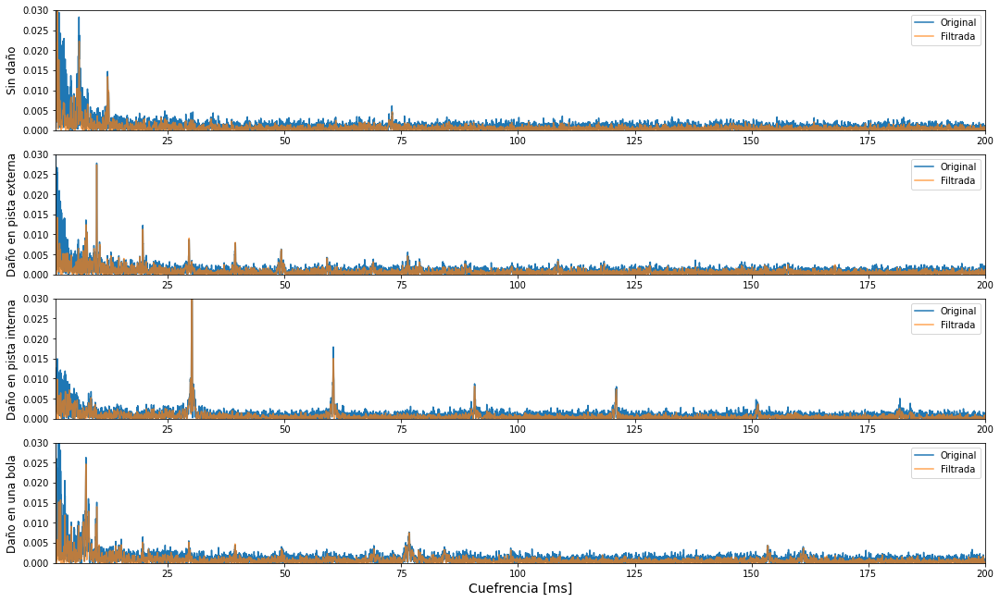

In [9]:
#@title Calculamos el cepstro real: de la señal original y a una filtrada con filtro pasabaja con fc=2000 Hz
b, a = sig.butter(2, 2000/(fs1/2), 'low')
senyal1f = sig.filtfilt(b, a, senyal1)
b, a = sig.butter(2, 2000/(fs2/2), 'low')
senyal2f = sig.filtfilt(b, a, senyal2)
b, a = sig.butter(2, 2000/(fs3/2), 'low')
senyal3f = sig.filtfilt(b, a, senyal3)
b, a = sig.butter(2, 2000/(fs4/2), 'low')
senyal4f = sig.filtfilt(b, a, senyal4)

senyal1hat = real_cepstrum(senyal1)
senyal2hat = real_cepstrum(senyal2)
senyal3hat = real_cepstrum(senyal3)
senyal4hat = real_cepstrum(senyal4)
senyal1fhat = real_cepstrum(senyal1f)
senyal2fhat = real_cepstrum(senyal2f)
senyal3fhat = real_cepstrum(senyal3f)
senyal4fhat = real_cepstrum(senyal4f)
# Grafiquemos:
fig = plt.figure(figsize=(18, 11))
ax1 = fig.add_subplot(4, 1, 1)
ax2 = fig.add_subplot(4, 1, 2)
ax3 = fig.add_subplot(4, 1, 3)
ax4 = fig.add_subplot(4, 1, 4)
ax1.plot(t1*1000,np.abs(senyal1hat),label='Original')
ax2.plot(t2*1000,np.abs(senyal2hat),label='Original')
ax3.plot(t3*1000,np.abs(senyal3hat),label='Original')
ax4.plot(t4*1000,np.abs(senyal4hat),label='Original')
ax1.plot(t1*1000,np.abs(senyal1fhat),alpha=0.7,label='Filtrada')
ax2.plot(t2*1000,np.abs(senyal2fhat),alpha=0.7,label='Filtrada')
ax3.plot(t3*1000,np.abs(senyal3fhat),alpha=0.7,label='Filtrada')
ax4.plot(t4*1000,np.abs(senyal4fhat),alpha=0.7,label='Filtrada')
for ax in [ax1, ax2, ax3, ax4]:
    ax.set_ylim([0,0.03])
    ax.set_xlim([1,200])
    ax.legend()
ax1.set_ylabel('Sin daño', fontsize=12)
ax2.set_ylabel('Daño en pista externa', fontsize=12)
ax3.set_ylabel('Daño en pista interna', fontsize=12)
ax4.set_ylabel('Daño en una bola', fontsize=12)
ax4.set_xlabel('Cuefrencia [ms]', fontsize=14);

In [10]:
#@title Otro ejemplo de rodamientos
N = 1530 # rpm: 1530 sale muy bien el cepstro; 1400 es lo que pone en la placa del motor eléctrico
# En mal estado
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/FAG-6204-C-2Z-mal01.wav') # descarga el fichero de Internet
with open('FAG-6204-C-2Z-mal01.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs_m, senyal_m = wavfile.read("FAG-6204-C-2Z-mal01.wav")
senyal_m = senyal_m.astype(float)
if len(np.shape(senyal_m)) > 1:
    senyal_m = senyal_m[:, 0] # grabación en estéreo: nos quedamos con solo un canal
y_m = senyal_m[int(0*fs_m):int(20*fs_m)]
N_m = len(y_m)
dur_m = N_m / fs_m
t_m = np.linspace(0, dur_m, N_m, endpoint=False)
tf_y_m = np.fft.fft(y_m)/N_m
frec_m = np.fft.fftfreq(N_m, 1/fs_m)
Nmitad_m = N_m//2 if N_m%2==0 else N_m//2+1
yRhat_m = real_cepstrum(y_m)

# En buen estado
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/FAG-6204-C-2Z-bien01.wav') # descarga el fichero de Internet
with open('FAG-6204-C-2Z-bien01.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs_b, senyal_b = wavfile.read("FAG-6204-C-2Z-bien01.wav") # lee el fichero del ordenador
senyal_b = senyal_b.astype(float)
if len(np.shape(senyal_b)) > 1:
    senyal_b = senyal_b[:, 0] # grabación en estéreo: nos quedamos con solo un canal
y_b = senyal_b[int(0*fs_b):int(20*fs_b)]
N_b = len(y_b)
dur_b = N_b / fs_b
t_b = np.linspace(0, dur_b, N_b, endpoint=False)
tf_y_b = np.fft.fft(y_b)/N_b
frec_b = np.fft.fftfreq(N_b, 1/fs_b)
Nmitad_b = N_b//2 if N_b%2==0 else N_b//2+1
yRhat_b = real_cepstrum(y_b)

# Frecuencias características del rodamiento. Ver: https://medias.schaeffler.es/es/ modelo: 6204-C-2Z
RPM = N / 60
FTF = 0.3815 * RPM # Hz; Fundamental Train Frequency
BPFO = 3.0522 * RPM # Hz; Ball Pass Frequency Outer race
BPFI = 4.9478 * RPM # Hz; Ball Pass Frequency Inner race
BSF = 1.9916 * RPM # Hz; Ball Spinning Frequency
RPFB = 3.9833 * RPM # Hz; Ring Pass Frequency on Ball

print('RPM:  {:.2f} Hz \t\t\t 1/RPM:  {:.2f} ms'.format(RPM,1/RPM*1000))
print('FTF:  {:.2f} Hz \t\t\t 1/FTF:  {:.2f} ms'.format(FTF,1/FTF*1000))
print('BPFO: {:.2f} Hz \t\t 1/BPFO: {:.2f} ms'.format(BPFO,1/BPFO*1000))
print('BPFI: {:.2f} Hz \t\t 1/BPFI: {:.2f} ms'.format(BPFI,1/BPFI*1000))
print('BSF:  {:.2f} Hz \t\t 1/BSF:  {:.2f} ms'.format(BSF,1/BSF*1000))
print('RPFB:  {:.2f} Hz \t\t 1/RPFB:  {:.2f} ms'.format(RPFB,1/RPFB*1000))


RPM:  25.50 Hz 			 1/RPM:  39.22 ms
FTF:  9.73 Hz 			 1/FTF:  102.79 ms
BPFO: 77.83 Hz 		 1/BPFO: 12.85 ms
BPFI: 126.17 Hz 		 1/BPFI: 7.93 ms
BSF:  50.79 Hz 		 1/BSF:  19.69 ms
RPFB:  101.57 Hz 		 1/RPFB:  9.85 ms


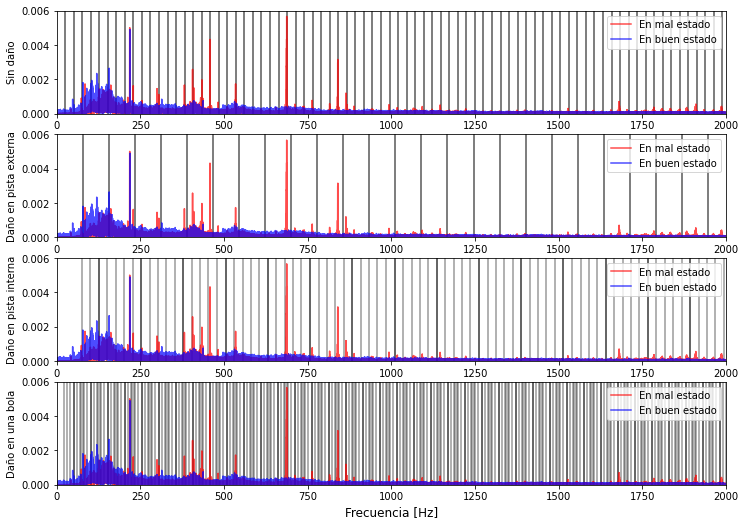

In [11]:
#@title Espectros
# Gráficas
fig = plt.figure(figsize=(12,11))
ax1 = fig.add_subplot(5, 1, 1)
ax2 = fig.add_subplot(5, 1, 2)
ax3 = fig.add_subplot(5, 1, 3)
ax4 = fig.add_subplot(5, 1, 4)
fmax = 2000 #16000

for arm in range(1,150):
    ax1.axvline(arm*RPM, color=([0,0,0,0.5]), lw=2)
# Líneas verticales con las frecuencias de fallo
for arm in range(1,50):
    ax2.axvline(arm*BPFO, color=([0,0,0,0.5]), lw=2)
for arm in range(1,33):
    ax3.axvline(arm*BPFI, color=([0,0,0,0.6]), lw=2)
    ax3.axvline(arm*BPFI+RPM, color=([0,0,0,0.3]), lw=2)
    ax3.axvline(arm*BPFI+2*RPM, color=([0,0,0,0.3]), lw=2)
    ax3.axvline(arm*BPFI-RPM, color=([0,0,0,0.3]), lw=2)
    ax3.axvline(arm*BPFI-2*RPM, color=([0,0,0,0.3]), lw=2)
for arm in range(1,80):
    ax4.axvline(arm*BSF, color=([0,0,0,0.6]), lw=2)
    ax4.axvline(arm*BSF+FTF, color=([0,0,0,0.3]), lw=2)
    ax4.axvline(arm*BSF+2*FTF, color=([0,0,0,0.3]), lw=2)
    ax4.axvline(arm*BSF+3*FTF, color=([0,0,0,0.3]), lw=2)
    ax4.axvline(arm*BSF-FTF, color=([0,0,0,0.3]), lw=2)
    ax4.axvline(arm*BSF-2*FTF, color=([0,0,0,0.3]), lw=2)
    ax4.axvline(arm*BSF-3*FTF, color=([0,0,0,0.3]), lw=2)

for eje in [ax1, ax2, ax3, ax4]:
    eje.plot(frec_m[0:Nmitad_m], (np.abs(tf_y_m[0:Nmitad_m])), color=([1,0,0,0.7]), label='En mal estado')
    eje.plot(frec_b[0:Nmitad_b], (np.abs(tf_y_b[0:Nmitad_b])), color=([0,0,1,0.7]), label='En buen estado')
    eje.set_xlim([0, fmax])
    eje.set_ylim([0, 0.006])
    eje.legend()

ax1.set_ylabel('Sin daño', fontsize=10)
ax2.set_ylabel('Daño en pista externa', fontsize=10)
ax3.set_ylabel('Daño en pista interna', fontsize=10)
ax4.set_ylabel('Daño en una bola', fontsize=10)
ax4.set_xlabel('Frecuencia [Hz]', fontsize=12);


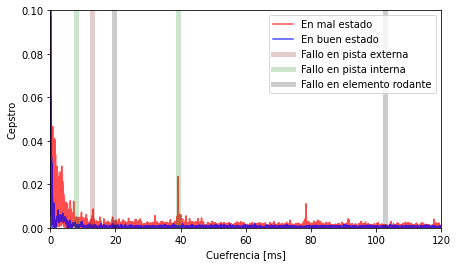

In [12]:
#@title Cepstros e identificación de cuefrencias
fig = plt.figure(figsize=(7, 4))
ax4 = fig.add_subplot(1, 1, 1)
ax4.plot(t_m*1000,np.abs(yRhat_m), color=([1,0,0,0.7]), label='En mal estado')
ax4.plot(t_b*1000,np.abs(yRhat_b), color=([0,0,1,0.7]), label='En buen estado')
ax4.axvline(1/BPFO*1000, color=([0.5,0,0,0.2]), lw=5, label='Fallo en pista externa')
ax4.axvline(1/RPM*1000, color=([0,0.5,0,0.2]), lw=5)
ax4.axvline(1/BPFI*1000, color=([0,0.5,0,0.2]), lw=5, label='Fallo en pista interna')
ax4.axvline(1/BSF*1000, color=([0,0,0,0.2]), lw=5, label='Fallo en elemento rodante')
ax4.axvline(1/FTF*1000, color=([0,0,0,0.2]), lw=5)
ax4.set_xlim(0,120)
ax4.set_ylim(0,0.1)
ax4.set_xlabel('Cuefrencia [ms]')
ax4.set_ylabel('Cepstro')
ax4.legend();

### Desequilibrio

- Una máquina rotativa presenta un desequilibrio cuando el centro de gravedad del rotor (o centro de masas) no coincide con el centro del eje de rotación (o centro geométrico)
- Como resultado aparece una fuerza centrífuga que gira a la misma velocidad que el eje produciendo una vibración
$$ F = m \, d \, \omega^2 $$
- La fuerza depende:
    - Linealmente con el desequilibrio y la masa del sistema equivalente
    - Del cuadrado de la velocidad de giro
- Causas del desequilibrio:
    - Acumulación no homogénea de polvo en las palas de un ventilador
    - Erosión o corrosión no homogéneas en el rodete de una bomba
    - No homogeneidad en la fundición de las piezas: formación de poros o burbujas
    - Excentricidad del rotor
    - Distribución desigual de las barras o devanados en un motor eléctrico
    - Pérdida de contrapesos de equilibrado
    - Eje doblado

    <img src="https://hcliment.webs.upv.es/docencia/dar/figs/tema06/desequilibrio01.jpg" style="width:50%;padding:1%;"/>
    <small>Fuente: <a href="https://power-mi.com/content/causes-imbalance">https://power-mi.com/content/causes-imbalance</a></small>


Un desequilibrio se manifiesta en el espectro en frecuencia por la aparición de subarmónicos.
- Máquina equilibrada: es normal que aparezca un contenido importante a la frecuencia dada por el régimen de giro y el número de palas (z x N)

<img src="https://hcliment.webs.upv.es/docencia/dar/figs/tema06/desequilibrio02.jpg"/>

- Máquina desequilibrada: aparece contenido importante en frecuencias dadas por el régimen de giro o armónicos de esta inferiores a z x N

<img src="https://hcliment.webs.upv.es/docencia/dar/figs/tema06/desequilibrio03.jpg"/>


In [13]:
#@title Análisis del desequilibrio de un ventilador de 4 palas
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/VentiladorNormal.wav') # descarga el fichero de Internet
with open('VentiladorNormal.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs1, senyal1 = wavfile.read("VentiladorNormal.wav") # lee el fichero del ordenador
if len(np.shape(senyal1)) > 1:
    senyal1 = senyal1[:, 0] # grabación en estéreo: nos quedamos con solo un canal
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/VentiladorDeseq.wav') # descarga el fichero de Internet
with open('VentiladorDeseq.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs0, senyal0 = wavfile.read("VentiladorDeseq.wav") # lee el fichero del ordenador
if len(np.shape(senyal0)) > 1:
    senyal0 = senyal0[:, 0] # grabación en estéreo: nos quedamos con solo un canal
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/VentiladorDeseqGrave.wav') # descarga el fichero de Internet
with open('VentiladorDeseqGrave.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs2, senyal2 = wavfile.read("VentiladorDeseqGrave.wav") # lee el fichero del ordenador
if len(np.shape(senyal2)) > 1:
    senyal2 = senyal2[:, 0] # grabación en estéreo: nos quedamos con solo un canal
# Quitamos los primeros segundos, hasta que se estabiliza el micrófono y todas las medidas duren 6 segundos
senyal1 = senyal1[fs1:]
N1 = len(senyal1)
tmax1 = N1 / fs1
tdeseado = 6
fmax = 16000
if tmax1 > tdeseado:
    # Recortamos la señal para no colapsar el ordenador
    N1 = int(N1 * tdeseado/tmax1)
    tmax1 = N1 / fs1
    senyal1 = senyal1[0:N1]
senyal0 = senyal0[fs0:]
N0 = len(senyal0)
tmax0 = N0 / fs0
tdeseado = 6
fmax = 16000
if tmax0 > tdeseado:
    # Recortamos la señal para no colapsar el ordenador
    N0 = int(N0 * tdeseado/tmax0)
    tmax0 = N0 / fs0
    senyal0 = senyal0[0:N0]
senyal2 = senyal2[fs2:]
N2 = len(senyal2)
tmax2 = N2 / fs2
tdeseado = 6
fmax = 16000
if tmax2 > tdeseado:
    # Recortamos la señal para no colapsar el ordenador
    N2 = int(N2 * tdeseado/tmax2)
    tmax2 = N2 / fs2
    senyal2 = senyal2[0:N2]
#print("Duración de la señal {} segundos. Frecuencia de muestreo: {} Hz. Número de puntos: {}".format(tmax, fs, N))
t1 = np.linspace(0, tmax1, N1)
t0 = np.linspace(0, tmax0, N0)
t2 = np.linspace(0, tmax2, N2)
# Cálculo de la transformada de Fourier y el vector de frecuencias
tf_senyal1 = np.fft.fft(senyal1) /N1*2
Nmitad1 = N1//2 if N1%2==0 else N1//2+1
frec1 = np.fft.fftfreq(N1, 1/fs1)
tf_senyal0 = np.fft.fft(senyal0) /N0*2
Nmitad0 = N0//2 if N0%2==0 else N0//2+1
frec0 = np.fft.fftfreq(N0, 1/fs0)
tf_senyal2 = np.fft.fft(senyal2) /N2*2
Nmitad2 = N2//2 if N2%2==0 else N2//2+1
frec2 = np.fft.fftfreq(N2, 1/fs2)
# Gráficas
fig = plt.figure(figsize=(18,6))
ax2 = fig.add_subplot(1, 1, 1)
ax2.plot(frec1[0:Nmitad1], np.abs(tf_senyal1[0:Nmitad1]), label='Normal')
ax2.plot(frec0[0:Nmitad0], np.abs(tf_senyal0[0:Nmitad0]), label='Desequilibrado leve')
ax2.plot(frec2[0:Nmitad2], np.abs(tf_senyal2[0:Nmitad2]), label='Desequilibrado excesivo')
ax2.set_ylabel('Amplitud de la señal', fontsize=14)

# Modifica las etiquetas para el eje X y el título en cada gráfica:
ax2.set_xlabel('Frecuencia [Hz]', fontsize=14)
ax2.set_title('Espectro', fontsize=14)
ax2.set_xlim([0, 200])
ax2.legend()

# Oigamos los audios
display('Normal, Desequilibrado leve y Desequilibrado excesivo:')
displayhoriz('Audio(senyal1, rate=fs1)', 'Audio(senyal0, rate=fs0)', 'Audio(senyal2, rate=fs2)')

Output hidden; open in https://colab.research.google.com to view.

**Análisis**

- El pico a 112 Hz es normal pues el ventilador gira a 1680 rpm (28 Hz) y el ventilador tiene 4 palas
- Es muy difícil encontrar una máquina rotativa que no presente un ligero desequilibrio: por eso la situación normal ya presenta información a 28Hz
- En este ejemplo, se desquilibra la máquina añadiendo más peso en una pala: no solo aparecen subarmónicos sino que además baja el régimen de giro como se observa en el desequilibrio leve.
- El desequilibrio grave está puesto a efectos didácticos: el régimen de giro de la máquina se reduce a la mitad (14 Hz)
- Nota: se puede determinar el régimen de giro a partir de la resta de dos armónicos consecutivos


### Rozamiento metal-metal


Duración de la señal 8.789333333333333 segundos. Frecuencia de muestreo: 48000 Hz. Número de puntos: 421888


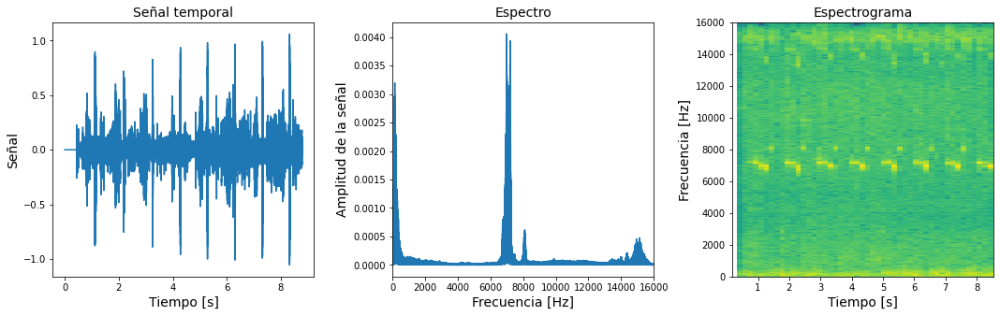

In [14]:
#@title Una cadena de bicicleta sin lubricación
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/BicycleChainWithoutLubrication01.wav') # descarga el fichero de Internet
with open('BicycleChainWithoutLubrication01.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs, senyal = wavfile.read("BicycleChainWithoutLubrication01.wav") # lee el fichero del ordenador
senyal = graf_tiempo_espectro_espectrograma(fs, senyal, tdeseado=15, fmax=16000, tamanyo_ventana=4096*2*2, solape_ventana=4096*2)
Audio(senyal, rate=fs)

**Análisis**

- El rozamiento metal-metal activa las frecuencias entre los 6000 y 8000 Hz
- En este caso el espectrograma permite detectar que este contacto es intermitente en la máquina en estudio


Duración de la señal 7.509333333333333 segundos. Frecuencia de muestreo: 48000 Hz. Número de puntos: 360448


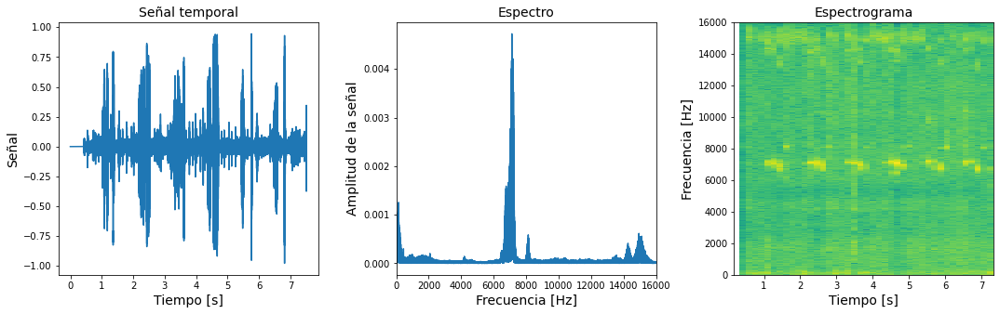

In [15]:
#@title Una cadena de bicicleta sin lubricación (repetición para analizar la sensibilidad)
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/BicycleChainWithoutLubrication02.wav') # descarga el fichero de Internet
with open('BicycleChainWithoutLubrication02.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs, senyal = wavfile.read("BicycleChainWithoutLubrication02.wav") # lee el fichero del ordenador
senyal = graf_tiempo_espectro_espectrograma(fs, senyal, tdeseado=15, fmax=16000, tamanyo_ventana=4096*2*2, solape_ventana=4096*2)
Audio(senyal, rate=fs)

Duración de la señal 14.417333333333334 segundos. Frecuencia de muestreo: 48000 Hz. Número de puntos: 692032


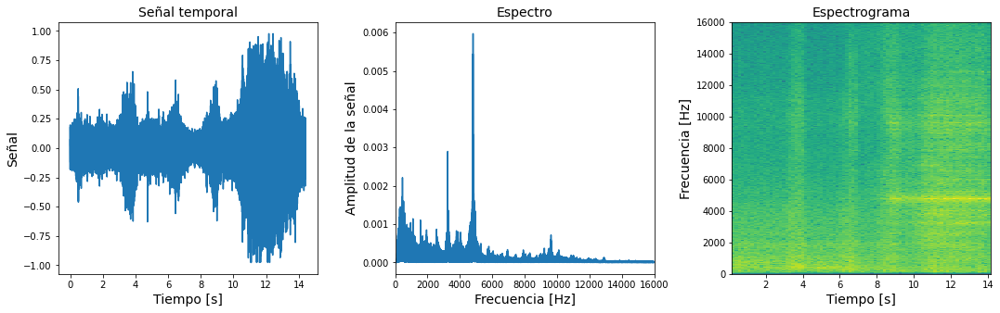

In [16]:
#@title Un tren en movimiento con contacto rueda-vía (metal-metal) en un curva al final
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/TrainBrakeGrinding01.wav') # descarga el fichero de Internet
with open('TrainBrakeGrinding01.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs, senyal = wavfile.read("TrainBrakeGrinding01.wav") # lee el fichero del ordenador
senyal = graf_tiempo_espectro_espectrograma(fs, senyal, tdeseado=15, fmax=16000, tamanyo_ventana=4096*2*2, solape_ventana=4096*2)
Audio(senyal, rate=fs)

**Análisis**

- El rozamiento metal-metal activa las frecuencias alrededor de los 5000 Hz
- En este caso el espectrograma permite detectar que este contacto aparece a partir de los 10 segundos


Duración de la señal 15.0 segundos. Frecuencia de muestreo: 48000 Hz. Número de puntos: 720000


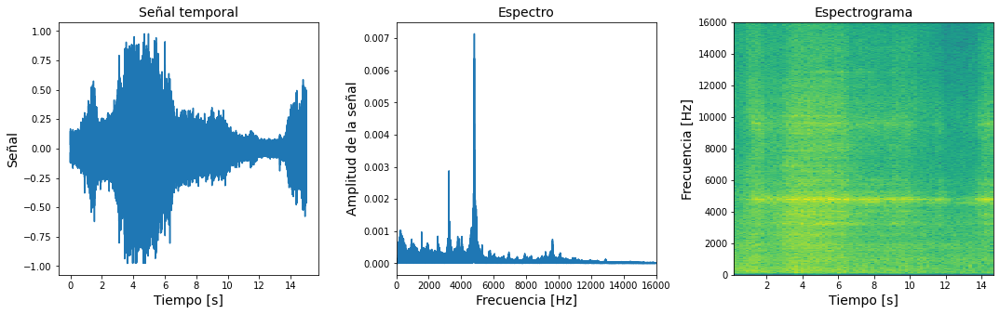

In [17]:
#@title Un tren en movimiento con contacto rueda-vía (metal-metal)
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/TrainBrakeGrinding02.wav') # descarga el fichero de Internet
with open('TrainBrakeGrinding02.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs, senyal = wavfile.read("TrainBrakeGrinding02.wav") # lee el fichero del ordenador
senyal = graf_tiempo_espectro_espectrograma(fs, senyal, tdeseado=15, fmax=16000, tamanyo_ventana=4096*2*2, solape_ventana=4096*2)
Audio(senyal, rate=fs)

### Impacto


Duración de la señal 0.09283446712018141 segundos. Frecuencia de muestreo: 44100 Hz. Número de puntos: 4094


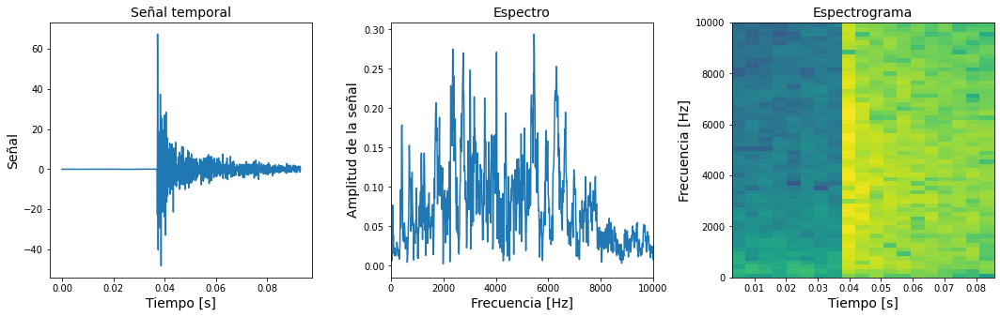

In [29]:
#@title Una caída de una bola de acero sobre una mesa: excita todas las frecuencias (hasta los 10 kHz)
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/Tiempo_bolaacero.txt') # descarga el fichero de Internet
with open('Tiempo_bolaacero.txt','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de texto
datos = pd.read_csv("Tiempo_bolaacero.txt", skiprows=84, skipfooter=23 , sep='\t', encoding = "ISO-8859-1", names=['col1', 'col2', 'col3'], engine='python')
tiempo = datos['col2'].values # vamos a quedarnos con los valores de la columna 2 en una variable "tiempo"
senyal = datos['col3'].values # y la columna 3 en una variable "senyal"
#senyal = senyal[int(fs*0.7):int(fs*0.8)]
senyal = graf_tiempo_espectro_espectrograma(fs, senyal, tdeseado=12, fmax=10000, tamanyo_ventana=256, solape_ventana=256/4)
Audio(senyal, rate=fs)

**Análisis**

- La señal temporal revela que el ruido se produce después de un breve silencio
- Todas las frecuencias hasta los 10000 Hz se excitan instantáneamente; esto indica que la señal es un impacto
- De hecho, un impacto recuerda mucho a la función $\delta$ de Dirac, cuya [transformada de Fourier](https://en.wikipedia.org/wiki/Dirac_delta_function#Fourier_transform) es constante
- La señal temporal recuerda a la del diapasón vista en un tema anterior y que se enseña a continuación; demostrándose de nuevo la necesidad del dominio en frecuencia como complemento al dominio temporal



Duración de la señal 0.08529166666666667 segundos. Frecuencia de muestreo: 48000 Hz. Número de puntos: 4094


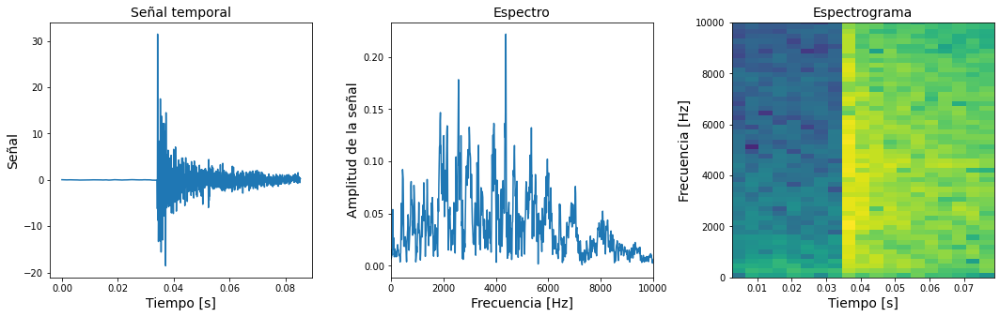

In [19]:
#@title Una caída de una bola de acero rodeada de goma sobre una mesa: excita todas las frecuencias (hasta los 10 kHz)
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/Tiempo_bolagoma.txt') # descarga el fichero de Internet
with open('Tiempo_bolagoma.txt','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de texto
datos = pd.read_csv("Tiempo_bolagoma.txt", skiprows=84, skipfooter=23 , sep='\t', encoding = "ISO-8859-1", names=['col1', 'col2', 'col3'], engine='python')
tiempo = datos['col2'].values # vamos a quedarnos con los valores de la columna 2 en una variable "tiempo"
senyal = datos['col3'].values # y la columna 3 en una variable "senyal"
#senyal = senyal[int(fs*0.7):int(fs*0.8)]
senyal = graf_tiempo_espectro_espectrograma(fs, senyal, tdeseado=12, fmax=10000, tamanyo_ventana=256, solape_ventana=256/4)
Audio(senyal, rate=fs)

Duración de la señal 12.0 segundos. Frecuencia de muestreo: 44100 Hz. Número de puntos: 529200


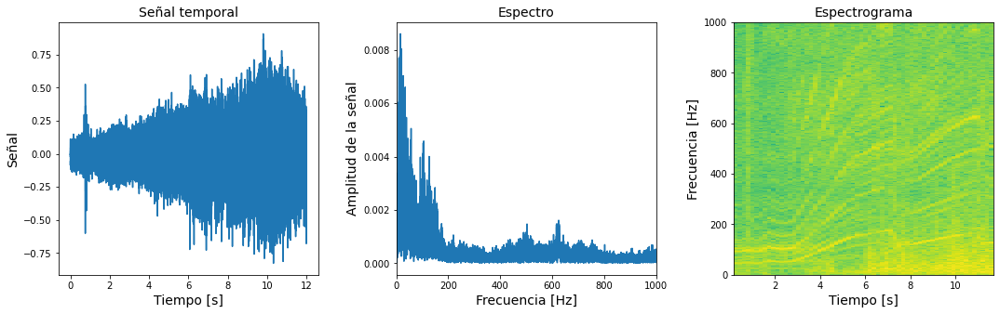

In [20]:
#@title Una aceleración de una motocicleta. Cambio de marcha antes de t=1s: similar a un impacto->excita todas las frecuencias
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/MotorcycleChainGearBox.wav') # descarga el fichero de Internet
with open('MotorcycleChainGearBox.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs, senyal = wavfile.read("MotorcycleChainGearBox.wav") # lee el fichero del ordenador
senyal = graf_tiempo_espectro_espectrograma(fs, senyal, tdeseado=12, fmax=1000, tamanyo_ventana=4096*2*2, solape_ventana=4096*2)
Audio(senyal, rate=fs)

Duración de la señal 0.2 segundos. Frecuencia de muestreo: 44100 Hz. Número de puntos: 8820


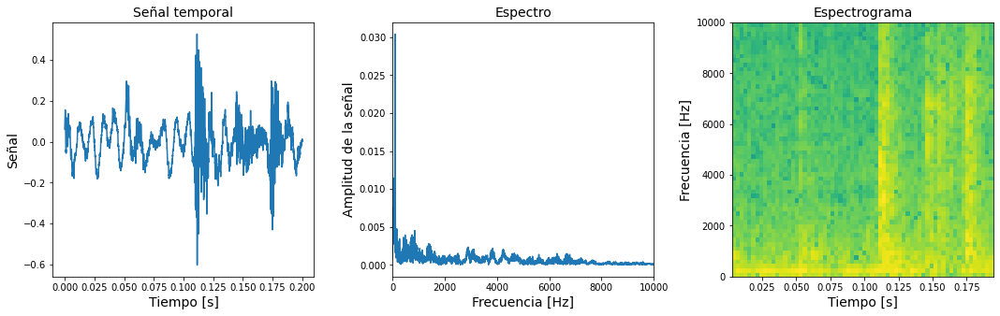

In [21]:
#@title Una aceleración de una motocicleta. Zoom en el momento del cambio de marcha: similar a un impacto->excita todas las frecuencias
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/MotorcycleChainGearBox.wav') # descarga el fichero de Internet
with open('MotorcycleChainGearBox.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs, senyal = wavfile.read("MotorcycleChainGearBox.wav") # lee el fichero del ordenador
senyal = senyal[int(fs*0.65):int(fs*0.85)]
senyal = graf_tiempo_espectro_espectrograma(fs, senyal, tdeseado=12, fmax=10000, tamanyo_ventana=256, solape_ventana=256/2)
Audio(senyal, rate=fs)

### Combustión


Duración de la señal 3.4667120181405897 segundos. Frecuencia de muestreo: 44100 Hz. Número de puntos: 152882


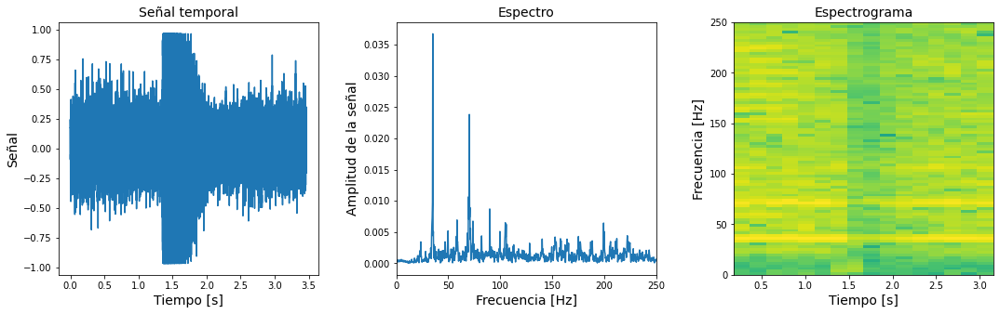

In [22]:
#@title Un autobús en marcha
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/BusIdlePullawayBrake.wav') # descarga el fichero de Internet
with open('BusIdlePullawayBrake.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs, senyal = wavfile.read("BusIdlePullawayBrake.wav") # lee el fichero del ordenador
senyal = graf_tiempo_espectro_espectrograma(fs, senyal, tdeseado=12, fmax=250, tamanyo_ventana=4096*2*2, solape_ventana=4096*2)
Audio(senyal, rate=fs)

**Análisis**

- El proceso de combustión de un motor de combustión interna alternativo excita frecuencias relativamente bajas
- 35 Hz sería el fundamental y 70 Hz (x2) y 105 Hz (x3) sus armónicos

### Flujo no estacionario y turbulento


Duración de la señal 3.4667120181405897 segundos. Frecuencia de muestreo: 44100 Hz. Número de puntos: 152882


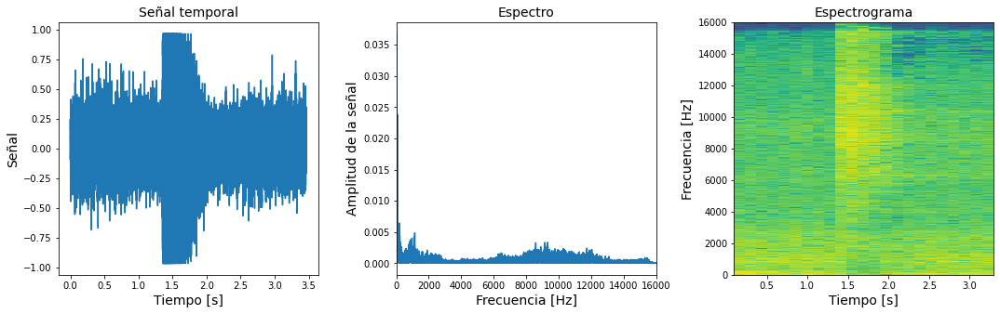

In [23]:
#@title La descarga de flujo a la atmósfera
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/BusIdlePullawayBrake.wav') # descarga el fichero de Internet
with open('BusIdlePullawayBrake.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs, senyal = wavfile.read("BusIdlePullawayBrake.wav") # lee el fichero del ordenador
senyal = graf_tiempo_espectro_espectrograma(fs, senyal, tdeseado=12, fmax=16000, tamanyo_ventana=4096*2, solape_ventana=2048)
Audio(senyal, rate=fs)

**Análisis**

- Los procesos de movimiento de un fluido llevan asociados fenómenos de turbulencia más o menos caóticos que excitan las altas frecuencias (6-12 kHz)

### Fuerzas magnéticas fluctuantes

In [24]:
IFrame('https://www.youtube.com/embed/5489-rzCaMQ', 600, 400)

Duración de la señal 9.833310657596371 segundos. Frecuencia de muestreo: 44100 Hz. Número de puntos: 433649


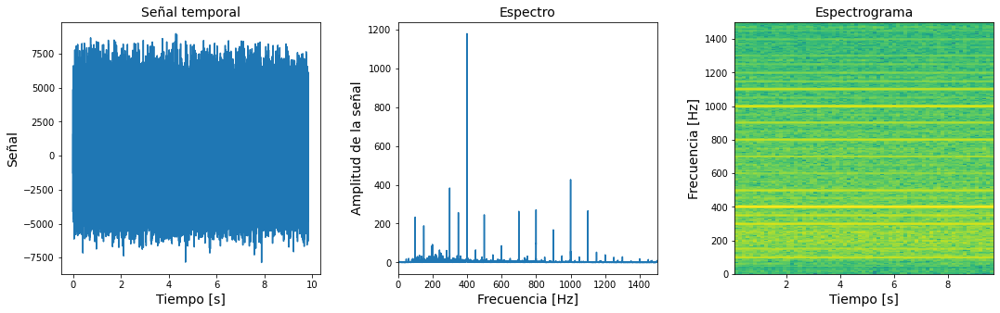

In [25]:
#@title Un transformador eléctrico
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/transformadorEdificio8i-UPV.wav') # descarga el fichero de Internet
with open('transformadorEdificio8i-UPV.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs, senyal = wavfile.read("transformadorEdificio8i-UPV.wav") # lee el fichero del ordenador
senyal = graf_tiempo_espectro_espectrograma(fs, senyal, tdeseado=12, fmax=1500, tamanyo_ventana=4096*2, solape_ventana=2048)
Audio(senyal, rate=fs)

Duración de la señal 4.8989375 segundos. Frecuencia de muestreo: 96000 Hz. Número de puntos: 470298


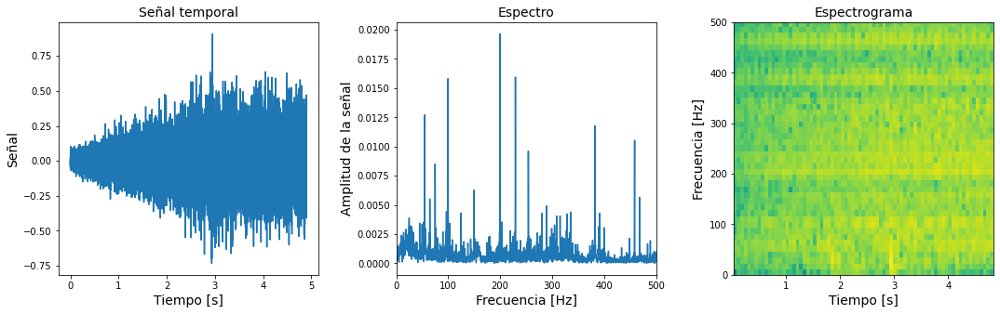

In [26]:
#@title Un motor eléctrico
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/ElectricMotor02.wav') # descarga el fichero de Internet
with open('ElectricMotor02.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs, senyal = wavfile.read("ElectricMotor02.wav") # lee el fichero del ordenador
senyal = graf_tiempo_espectro_espectrograma(fs, senyal, tdeseado=12, fmax=500, tamanyo_ventana=4096*2, solape_ventana=2048)
Audio(senyal, rate=fs)

### Otros ejemplos


Duración de la señal 12.0 segundos. Frecuencia de muestreo: 44100 Hz. Número de puntos: 529200


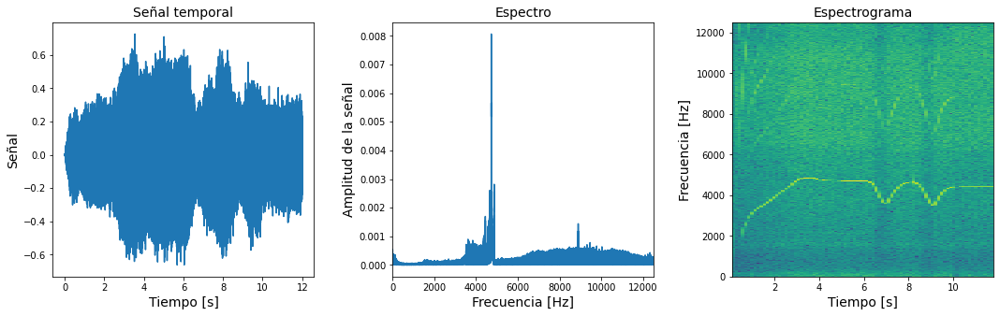

In [27]:
#@title Un torno dental
# Descarga en el ordenador el audio
fichin = urllib.request.urlopen('https://hcliment.webs.upv.es/docencia/dar/sounds/tema06/DentalDrill.wav') # descarga el fichero de Internet
with open('DentalDrill.wav','wb') as fichout:
    fichout.write(fichin.read()) # guarda el fichero en el ordenador
# Lectura de un fichero de audio (en formato WAV)
fs, senyal = wavfile.read("DentalDrill.wav") # lee el fichero del ordenador
senyal = graf_tiempo_espectro_espectrograma(fs, senyal, tdeseado=12, fmax=12500, tamanyo_ventana=4096*2, solape_ventana=2048)
Audio(senyal, rate=fs)

# Fin del tema